In [8]:
# Python common libreries

import matplotlib.pyplot as plt # crear graficos
plt.rcParams["figure.figsize"] = (10,5) # cambiar el tamano de las figuras
import seaborn as sns # graficos con dataframes
import statsmodels.api as sm

from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import datasets

import numpy as np
import pandas as pd

"ML/AI models are getting more complex and challenging to interpret and explain. A simple, easy-to-explain regression or decision tree model can no longer fully satisfy technical and business needs. More and more people use ensemble methods and deep neural networks to get better predictions and accuracy. However, those more complex models are hard to explain, debug, and understand. Thus, many people call these models black-box models.

When we train an ML/AI model, we often focus on technical details like step size, layers, early stopping, dropout, dilation, and so on. We don’t really know why our model behaves a certain way. For example, consider a credit risk model. Why does our model assign a certain score to an individual? What features does our model rely on? Does our model heavily rely on a feature that is incorrect? Even if our model does not take race and gender as input features, does our model infer those attributes from other features and introduce biases toward certain groups? Can stakeholders understand and trust the model behavior? Can the model provide people guidelines on how to improve their credit scores? Model interpretation and explanation can offer insights into these questions, help us debug the model, mitigate bias, and establish transparency and trust.

There has been an increasing interest in machine learning model interpretability and explainability. Researchers and ML practitioners have designed many explanation techniques."

Text from: https://towardsdatascience.com/model-interpretability-and-explainability-27fe31cc0688



# SHAP (SHapley Additive exPlanations)

https://shap.readthedocs.io/en/latest/

“SHAP (SHapley Additive exPlanations) is a game theoretic approach to explain the output of any machine learning model. It connects optimal credit allocation with local explanations using the classic Shapley values from game theory and their related extensions.”
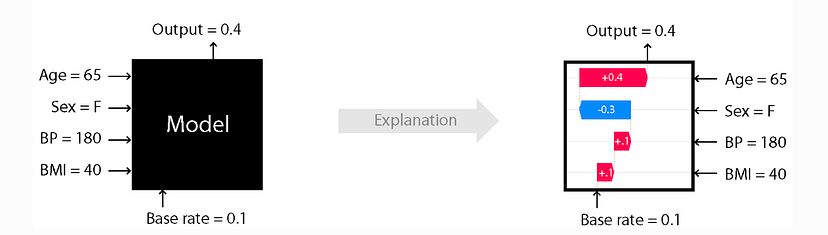

Figure 1 shows the gist of how SHAP works. Assuming that the base rate, i.e., the prior background expectation for the predicted value E[f(x)], is 0.1. Now we have a new observation with the features age=65, sex=F, BP=180, BMI=40. The predicted value of this new observation is 0.4. How do we explain this difference between the output value of 0.4 and the base rate of 0.1? This is where Shapley values come into play:

Let’s start with the base rate 0.1.
Adding the BMI Shapely value of 0.1, we get 0.2.
Adding the BP Shapely value of 0.1, we get 0.3.
Adding the Sex Shapely value of -0.3, we get 0.
Adding the Age Shapely value of 0.4, we get 0.4
Based on the additive nature of Shapely values, the model prediction is 0.4 for this new observation. The SHAP values provide insights into the importance of each feature and explain how the model prediction works.

How do we calculate the Shapley values? SHAP plots partial dependence plots from a linear model where the x-axis represents the feature and the y-axis represent the expected value of the output given the feature (see Figure 2). The Shapley value for a feature is the difference between the expected model output and the partial dependence plot at a given value of this feature, i.e., the length of the red line in the figure.

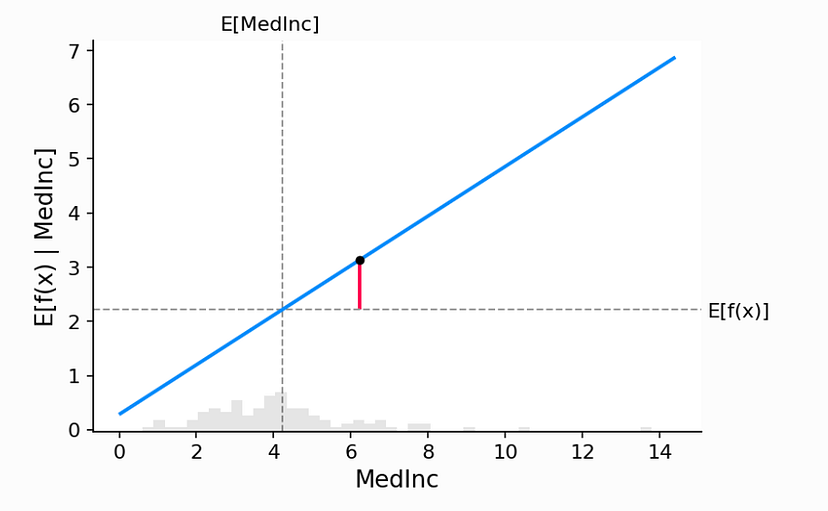

## SHAP instalation

In [2]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
import shap

## Example - Carseats

In [4]:
carseats = sm.datasets.get_rdataset("Carseats", "ISLR")
data = carseats.data

In [5]:
data['High Sales'] = np.where(data.Sales > 8, 1, 0)
# Una vez creada la nueva variable respuesta se descarta la original
data = data.drop(columns = 'Sales')

X = data[data.columns[:-1]]



target_name = 'High Sales'
y = data[target_name]

In [6]:
data.head()

,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US,High Sales
0,138,73,11,276,120,Bad,42,17,Yes,Yes,1
1,111,48,16,260,83,Good,65,10,Yes,Yes,1
2,113,35,10,269,80,Medium,59,12,Yes,Yes,1
3,117,100,4,466,97,Medium,55,14,Yes,Yes,0
4,141,64,3,340,128,Bad,38,13,Yes,No,0


In [7]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

# One-hot-encoding de las variables categóricas
# ==============================================================================
# Se identifica el nobre de las columnas numéricas y categóricas
cat_cols = X.select_dtypes(include=['object', 'category']).columns.to_list()
numeric_cols = X.select_dtypes(include=['float64', 'int']).columns.to_list()

# Se aplica one-hot-encoding solo a las columnas categóricas
preprocessor = ColumnTransformer(
                    [('onehot', OneHotEncoder(handle_unknown='ignore'), cat_cols)],
                    remainder='passthrough'
               )

# Una vez que se ha definido el objeto ColumnTransformer, con el método fit()
# se aprenden las transformaciones con los datos de entrenamiento y se aplican a
# los dos conjuntos con transform(). Ambas operaciones a la vez con fit_transform().
X_prep = preprocessor.fit_transform(X)

# Convertir el output del ColumnTransformer en dataframe y añadir nombre columnas
# ==============================================================================
# Nombre de todas las columnas
encoded_cat = preprocessor.named_transformers_['onehot'].get_feature_names_out(cat_cols)
labels = np.concatenate([encoded_cat,numeric_cols])

# Conversión a dataframe
X_prep = pd.DataFrame(X_prep, columns=labels)
X_prep.info()

seed = 42
np.random.seed(seed)

# We have to transform categorical variables to use sklearn models
X_train, X_test, y_train, y_test = train_test_split(X_prep, y, test_size=0.20, random_state=seed)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ShelveLoc_Bad     400 non-null    float64
 1   ShelveLoc_Good    400 non-null    float64
 2   ShelveLoc_Medium  400 non-null    float64
 3   Urban_No          400 non-null    float64
 4   Urban_Yes         400 non-null    float64
 5   US_No             400 non-null    float64
 6   US_Yes            400 non-null    float64
 7   CompPrice         400 non-null    float64
 8   Income            400 non-null    float64
 9   Advertising       400 non-null    float64
 10  Population        400 non-null    float64
 11  Price             400 non-null    float64
 12  Age               400 non-null    float64
 13  Education         400 non-null    float64
dtypes: float64(14)
memory usage: 43.9 KB


In [8]:
# Boosting regression model:
model = GradientBoostingClassifier()
model.fit(X_train, y_train)

GradientBoostingClassifier()

In [16]:
# visualize the first prediction's explanation
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train)


shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], X_train.iloc[0,:])

The above explanation shows features each contributing to push the model output from the base value (the average model output over the training dataset we passed) to the model output. Features pushing the prediction higher are shown in red, those pushing the prediction lower are in blue.

If we take many explanations such as the one shown above, rotate them 90 degrees, and then stack them horizontally, we can see explanations for an entire dataset (in the notebook this plot is interactive):

In [10]:
# visualize the training set predictions
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X_train)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


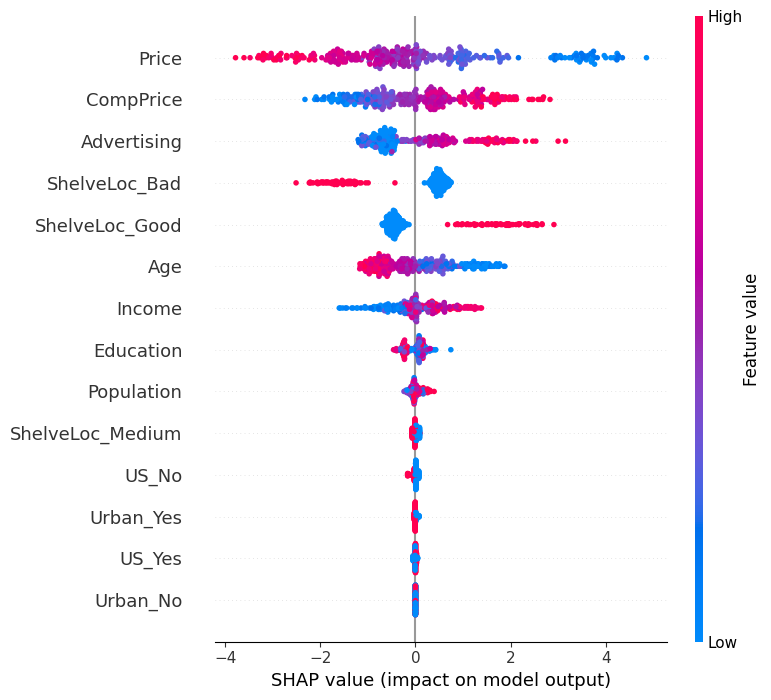

In [18]:
# summarize the effects of all the features
shap.summary_plot(shap_values, X_train)

To get an overview of which features are most important for a model we can plot the SHAP values of every feature for every sample. The plot below sorts features by the sum of SHAP value magnitudes over all samples, and uses SHAP values to show the distribution of the impacts each feature has on the model output. The color represents the feature value (red high, blue low). This reveals for example that a high LSTAT (% lower status of the population) lowers the predicted home price.

## Example - California Housing dataset - Numerical variables and regression

This dataset was obtained from the StatLib repository.
https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

This dataset was derived from the 1990 U.S. census, using one row per census
block group. A block group is the smallest geographical unit for which the U.S.
Census Bureau publishes sample data (a block group typically has a population
of 600 to 3,000 people).

A household is a group of people residing within a home. Since the average
number of rooms and bedrooms in this dataset are provided per household, these
columns may take surprisingly large values for block groups with few households
and many empty houses, such as vacation resorts.

In [21]:
# read data and subsampling only with 1000 samples
dataset = datasets.fetch_california_housing()
X = pd.DataFrame(dataset.data,columns = dataset.feature_names)
y = dataset.target
data = X.copy()
data[dataset.target_names[0]]=y
target_name = dataset.target_names[0]

data = data.sample(1000)
X = data[data.columns[:-1]]
y = data[target_name]

In [22]:
data

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
8440,3.8000,41.0,4.773893,1.023310,1191.0,2.776224,33.91,-118.36,2.225
9676,3.2431,14.0,52.848214,11.410714,265.0,2.366071,37.64,-119.02,2.214
2585,1.1479,29.0,4.023529,1.103529,990.0,2.329412,40.87,-124.08,1.011
17706,4.4792,15.0,4.981627,1.036745,1527.0,4.007874,37.31,-121.81,2.125
15999,4.6071,52.0,6.030189,1.075472,689.0,2.600000,37.75,-122.47,3.374
...,...,...,...,...,...,...,...,...,...
17150,5.2421,40.0,5.330935,0.988010,1050.0,2.517986,37.43,-122.20,4.445
2458,3.3214,35.0,5.561798,1.078652,674.0,3.786517,36.52,-119.59,1.016
13410,3.6602,18.0,5.455840,1.068376,2767.0,3.941595,34.08,-117.46,1.207
14588,4.0114,30.0,4.878465,0.955224,1240.0,2.643923,32.83,-117.19,1.698


In [23]:
# Print input variables:
X.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
8440,3.8000,41.0,4.773893,1.023310,1191.0,2.776224,33.91,-118.36
9676,3.2431,14.0,52.848214,11.410714,265.0,2.366071,37.64,-119.02
2585,1.1479,29.0,4.023529,1.103529,990.0,2.329412,40.87,-124.08
17706,4.4792,15.0,4.981627,1.036745,1527.0,4.007874,37.31,-121.81
15999,4.6071,52.0,6.030189,1.075472,689.0,2.600000,37.75,-122.47


In [24]:
# Print name of output:
print(target_name)

MedHouseVal


Ignoring `palette` because no `hue` variable has been assigned.


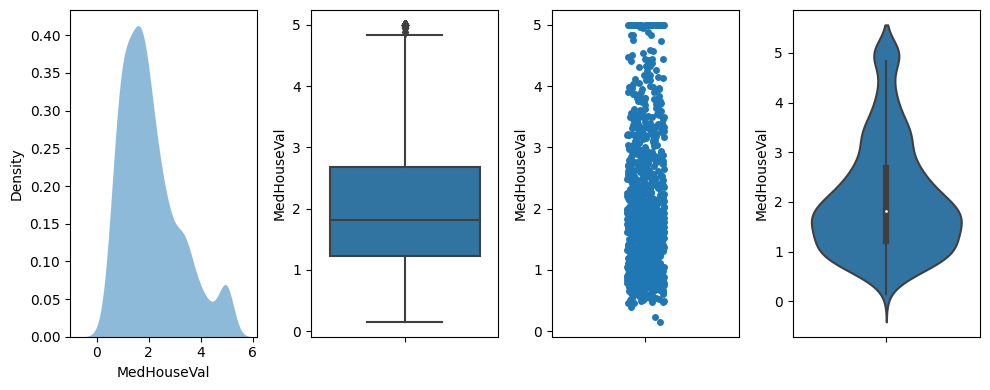

In [25]:
# EDA target data
fig, axs = plt.subplots(ncols=4, figsize=(10, 4))
sns.kdeplot(
    data=data, x=target_name,
    fill=True, common_norm=False, palette="crest",
    alpha=.5, linewidth=0, ax=axs[0])
sns.boxplot(data=data, y=target_name,ax=axs[1])
sns.stripplot(y= target_name,data=data,ax=axs[2])
sns.violinplot(data=data, y=target_name,ax=axs[3])
fig.tight_layout()
plt.show()

Ignoring `palette` because no `hue` variable has been assigned.


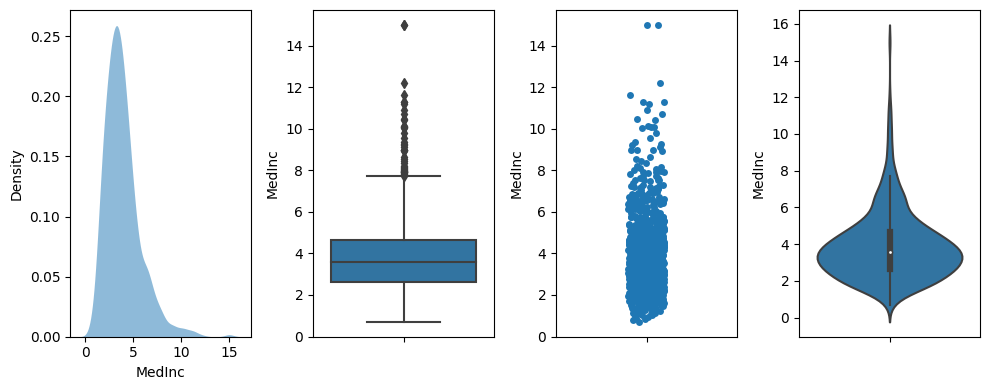

Ignoring `palette` because no `hue` variable has been assigned.


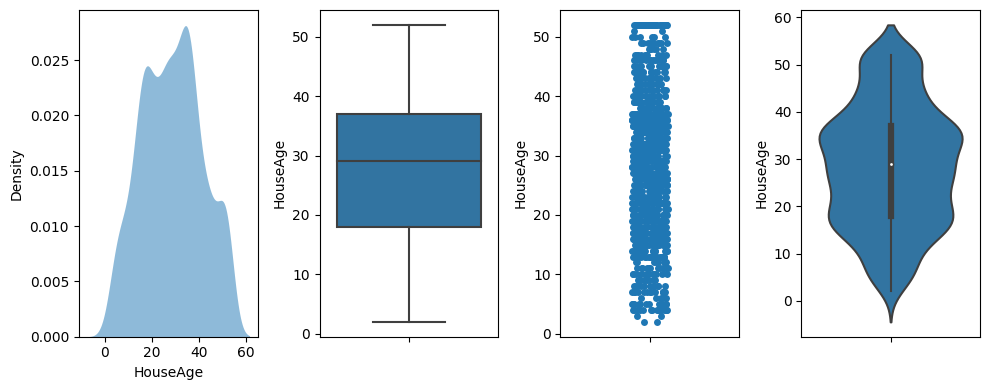

Ignoring `palette` because no `hue` variable has been assigned.


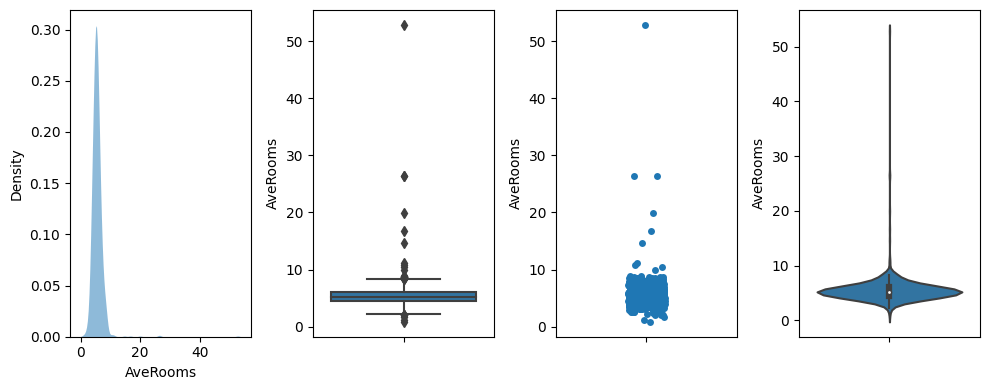

Ignoring `palette` because no `hue` variable has been assigned.


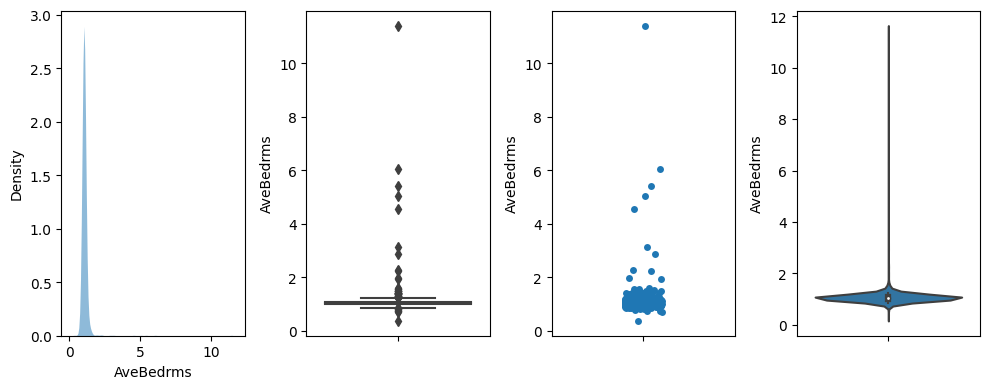

Ignoring `palette` because no `hue` variable has been assigned.


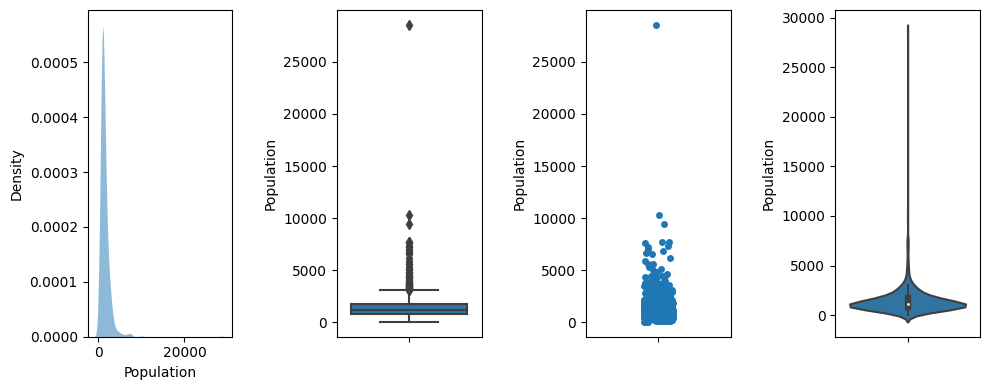

Ignoring `palette` because no `hue` variable has been assigned.


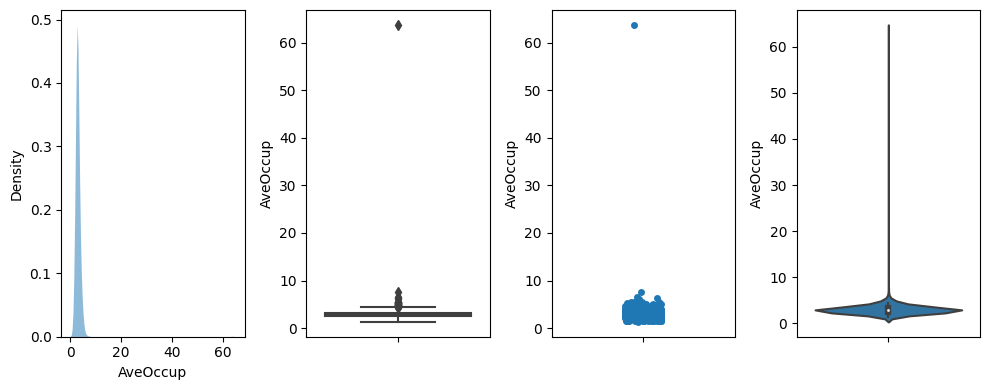

Ignoring `palette` because no `hue` variable has been assigned.


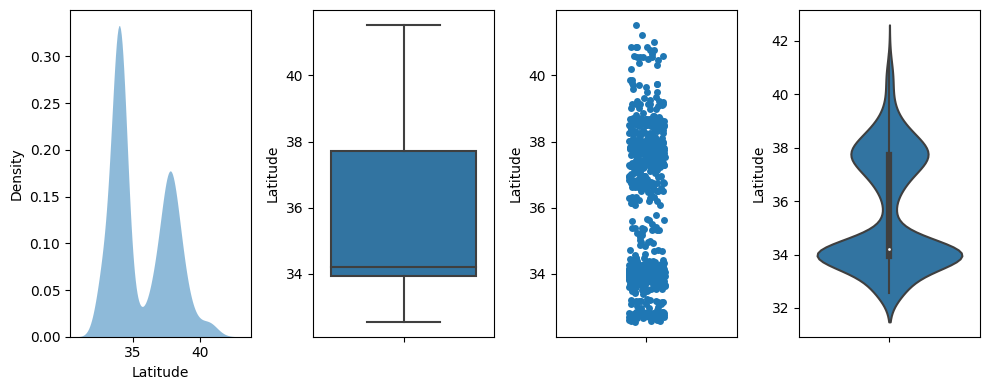

Ignoring `palette` because no `hue` variable has been assigned.


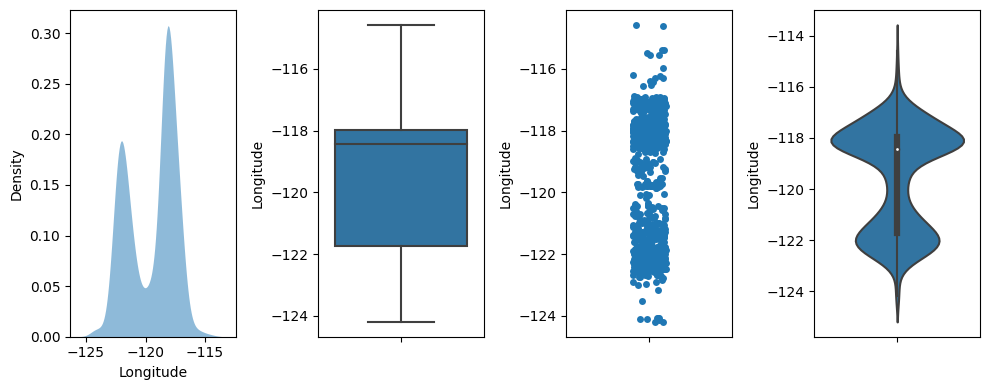

In [26]:
# EDA input data
var_num = X.columns
for i in var_num:
    fig, axs = plt.subplots(ncols=4, figsize=(10, 4))
    sns.kdeplot(
       data=data, x=i,
       fill=True, common_norm=False, palette="crest",
       alpha=.5, linewidth=0, ax=axs[0])
    sns.boxplot(data=data, y=i,ax=axs[1])
    sns.stripplot(y= i,data=data,ax=axs[2])
    sns.violinplot(data=data, y=i,ax=axs[3])
    fig.tight_layout()
    plt.show()

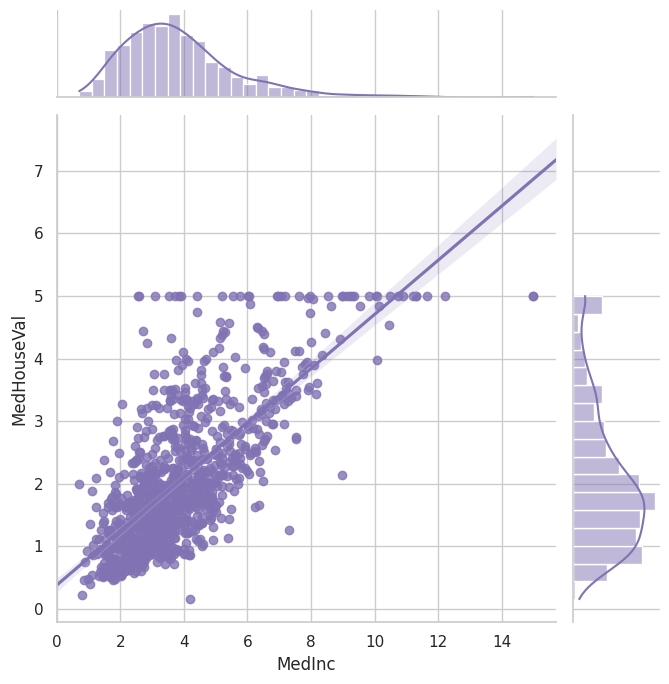

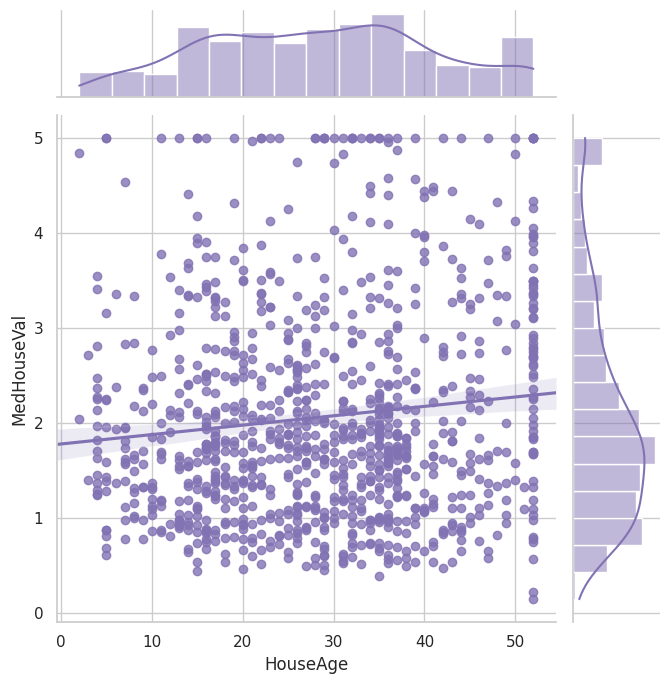

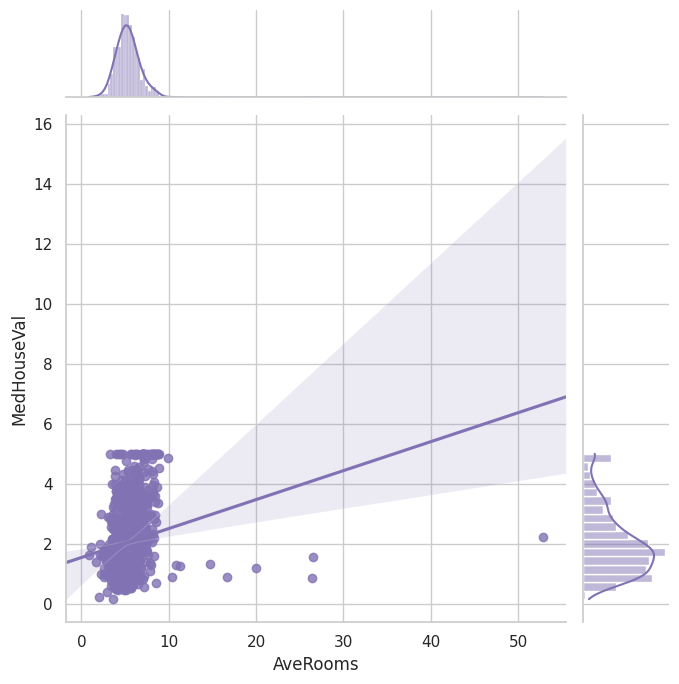

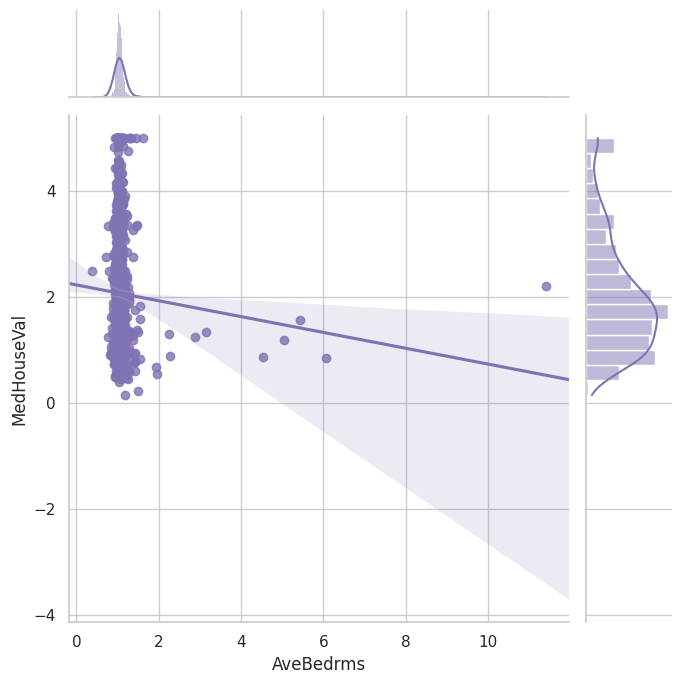

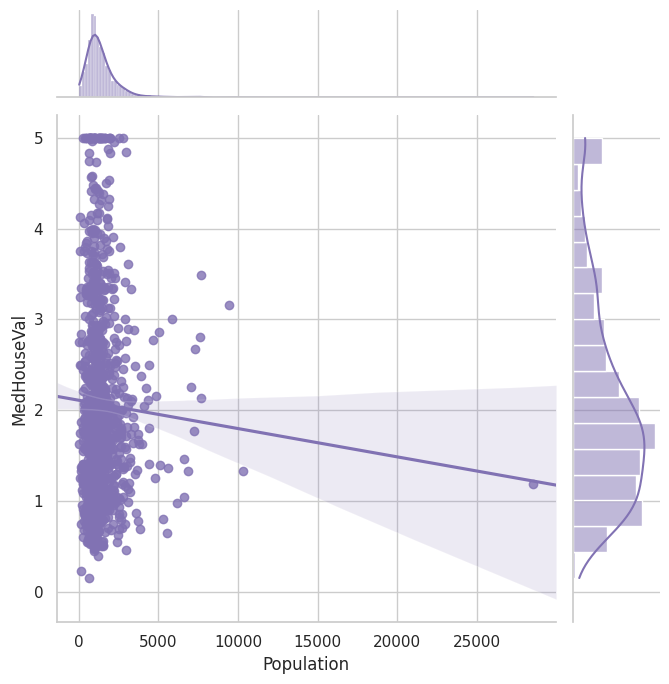

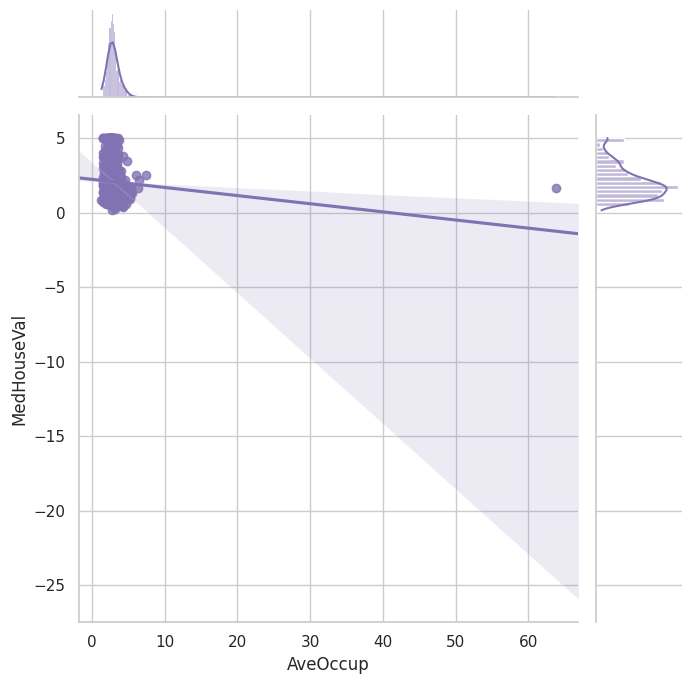

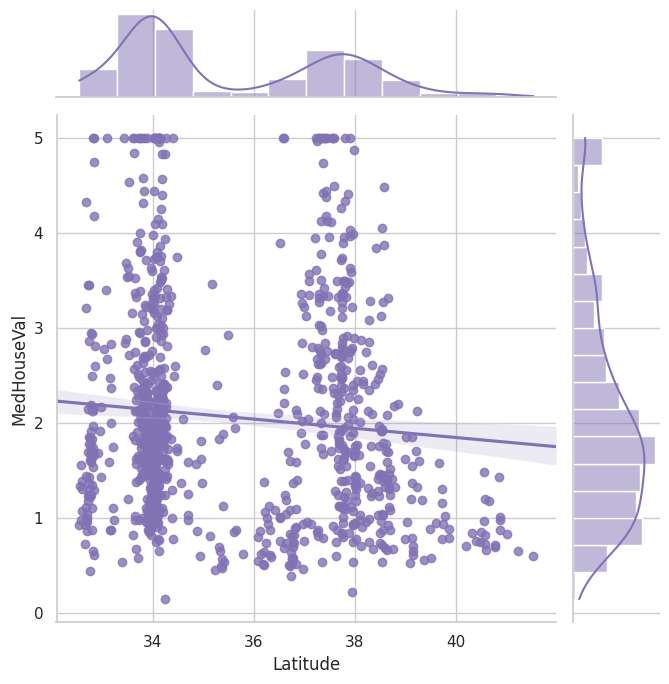

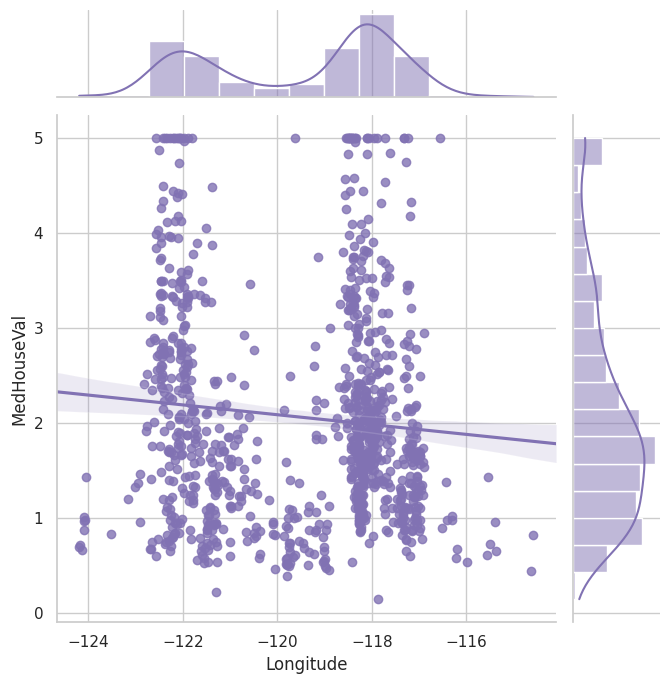

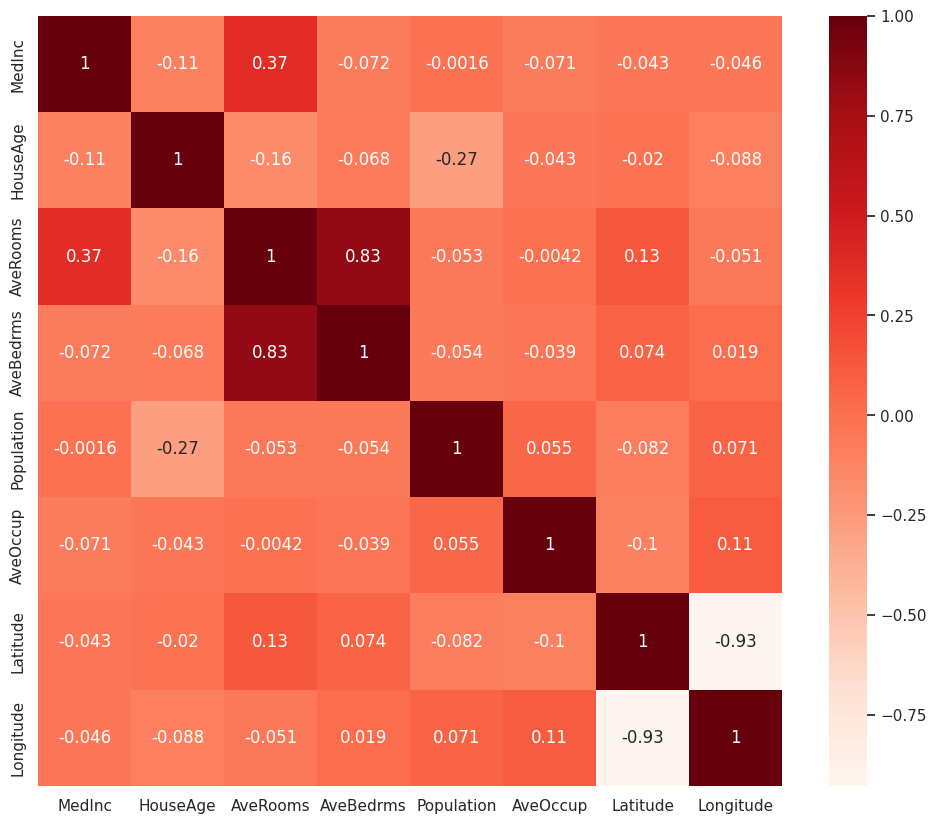

In [29]:
# Include correlation plot and matrixplot inputs vs output
sns.set_theme(style="whitegrid")
for i in X.columns:
    g = sns.jointplot(x=i, y='MedHouseVal', data=data,
                      kind="reg", truncate=False,
                      color="m", height=7)

#Using Pearson Correlation
plt.figure(figsize=(12,10))
cor = X.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [30]:
# Boosting regression model:
model = GradientBoostingRegressor()
model.fit(X, y)

GradientBoostingRegressor()

In [31]:
# visualize the first prediction's explanation
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

In [32]:
# visualize the training set predictions
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


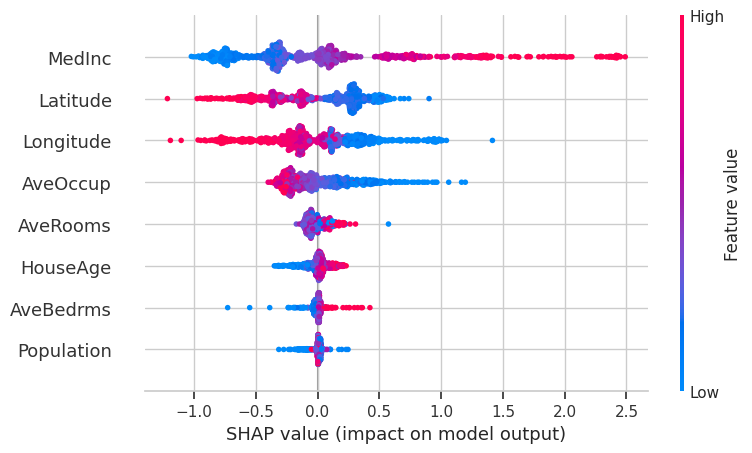

In [34]:
# summarize the effects of all the features
shap.summary_plot(shap_values, X)

## Example - Boston dataset - Numerical variables and regression

The Boston Housing Dataset

The Boston Housing Dataset is a derived from information collected by the U.S. Census Service concerning housing in the area of Boston MA. The following describes the dataset columns:

CRIM - per capita crime rate by town

ZN - proportion of residential land zoned for lots over 25,000 sq.ft.

INDUS - proportion of non-retail business acres per town.

CHAS - Charles River dummy variable (1 if tract bounds river; 0 otherwise)

NOX - nitric oxides concentration (parts per 10 million)

RM - average number of rooms per dwelling

AGE - proportion of owner-occupied units built prior to 1940

DIS - weighted distances to five Boston employment centres

RAD - index of accessibility to radial highways

TAX - full-value property-tax rate per $10,000

PTRATIO - pupil-teacher ratio by town

B - 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town

LSTAT - % lower status of the population

MEDV - Median value of owner-occupied homes in $1000's

In [35]:
import pandas as pd
import numpy as np

df = pd.read_csv(
    filepath_or_buffer="http://lib.stat.cmu.edu/datasets/boston",
    delim_whitespace=True,
    skiprows=21,
    header=None,
)

columns = [
    'CRIM',
    'ZN',
    'INDUS',
    'CHAS',
    'NOX',
    'RM',
    'AGE',
    'DIS',
    'RAD',
    'TAX',
    'PTRATIO',
    'B',
    'LSTAT',
    'MEDV',
]

#Flatten all the values into a single long list and remove the nulls
values_w_nulls = df.values.flatten()
all_values = values_w_nulls[~np.isnan(values_w_nulls)]

#Reshape the values to have 14 columns and make a new df out of them
data = pd.DataFrame(
    data = all_values.reshape(-1, len(columns)),
    columns = columns,
)

X = data[data.columns[:-1]]
target_name = 'MEDV'
y = data[target_name]

In [36]:
# Print input variables:
X.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


In [37]:
# Print name of output:
print(target_name)

MEDV


Ignoring `palette` because no `hue` variable has been assigned.


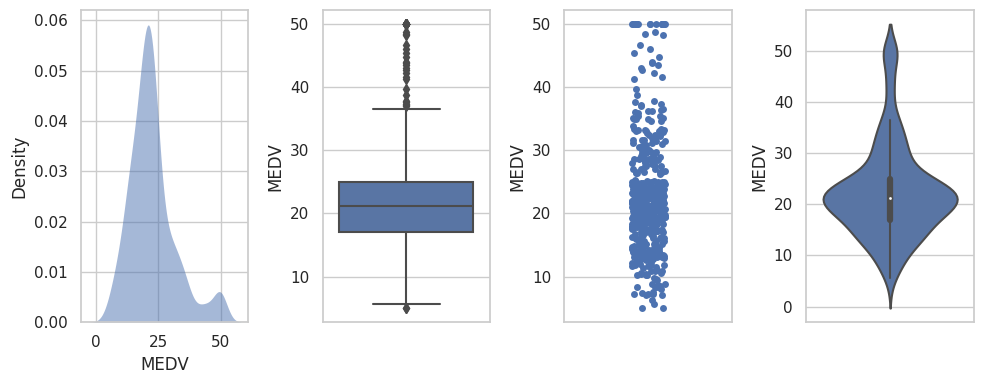

In [38]:
# EDA target data
fig, axs = plt.subplots(ncols=4, figsize=(10, 4))
sns.kdeplot(
    data=data, x=target_name,
    fill=True, common_norm=False, palette="crest",
    alpha=.5, linewidth=0, ax=axs[0])
sns.boxplot(data=data, y=target_name,ax=axs[1])
sns.stripplot(y= target_name,data=data,ax=axs[2])
sns.violinplot(data=data, y=target_name,ax=axs[3])
fig.tight_layout()
plt.show()

Ignoring `palette` because no `hue` variable has been assigned.


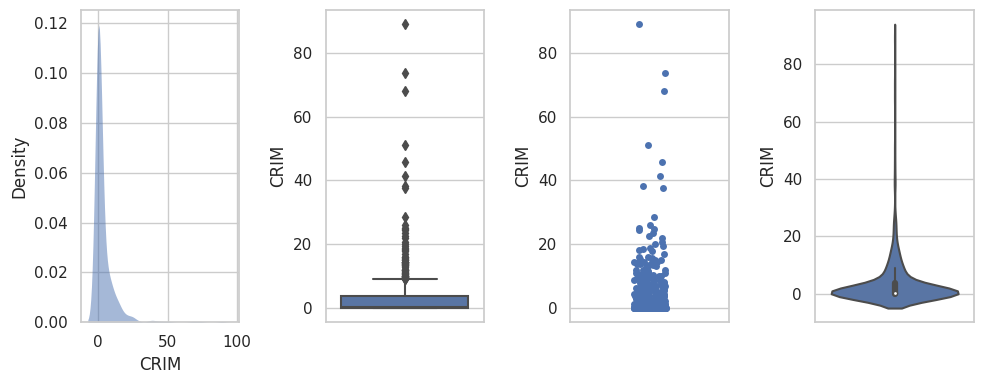

Ignoring `palette` because no `hue` variable has been assigned.


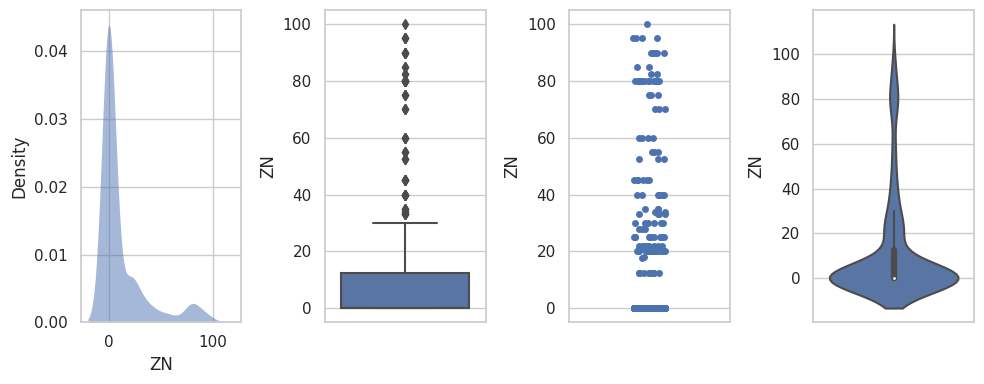

Ignoring `palette` because no `hue` variable has been assigned.


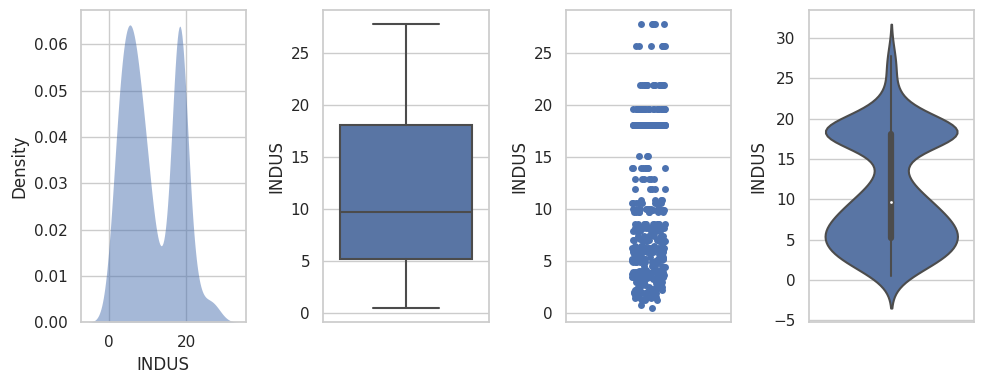

Ignoring `palette` because no `hue` variable has been assigned.


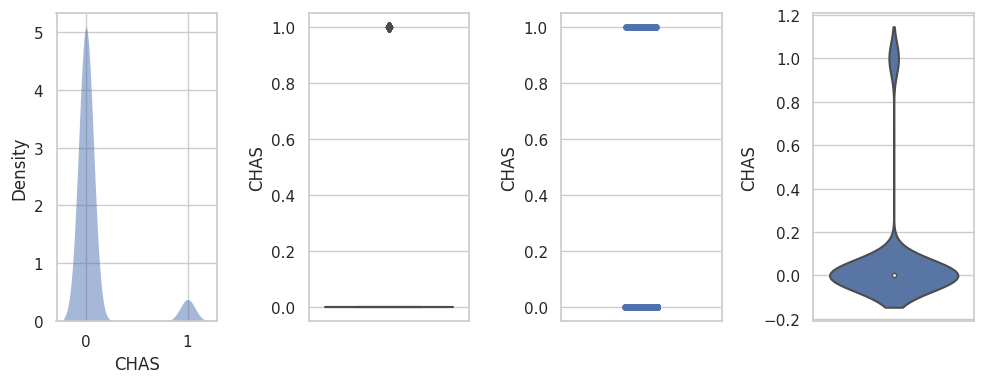

Ignoring `palette` because no `hue` variable has been assigned.


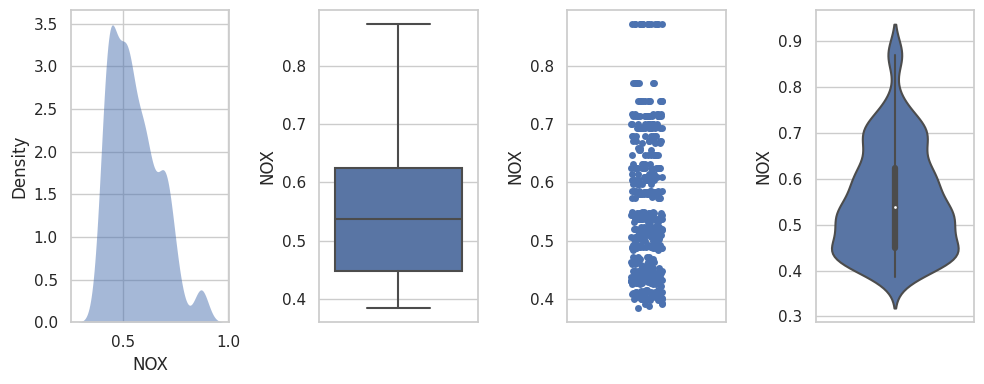

Ignoring `palette` because no `hue` variable has been assigned.


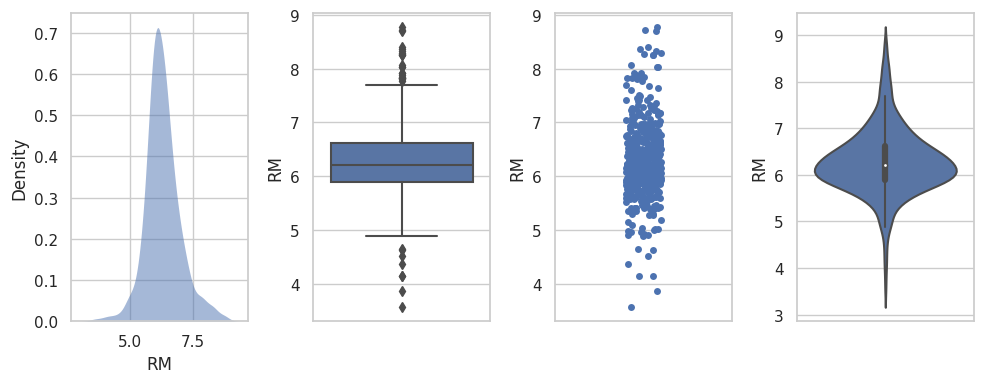

Ignoring `palette` because no `hue` variable has been assigned.


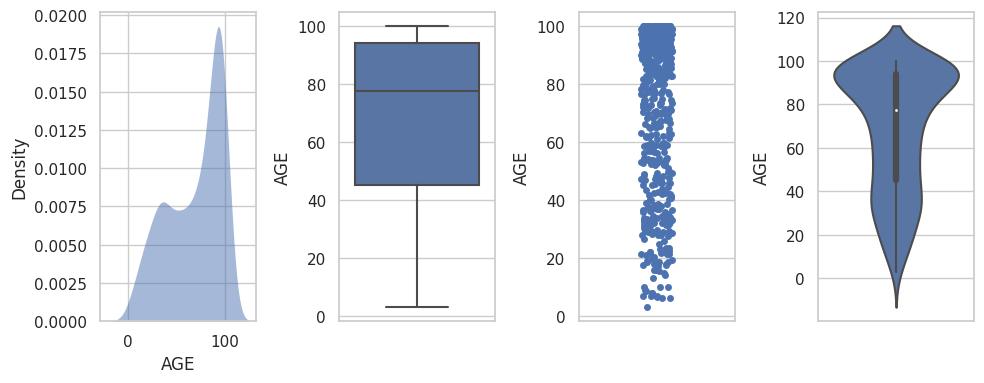

Ignoring `palette` because no `hue` variable has been assigned.


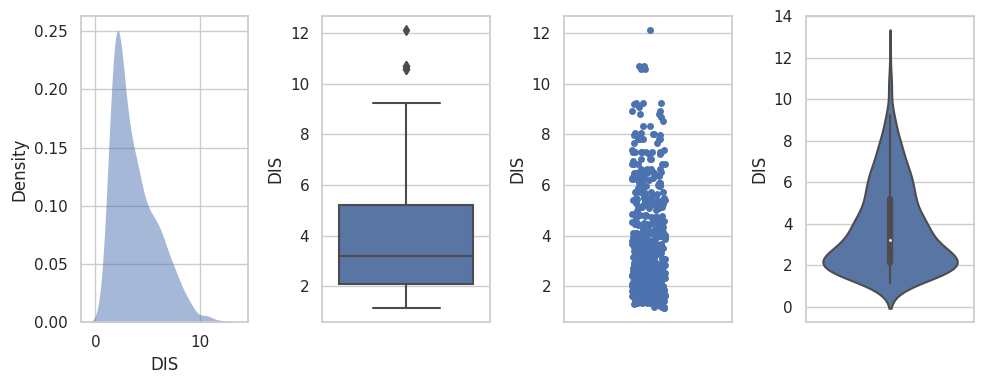

Ignoring `palette` because no `hue` variable has been assigned.


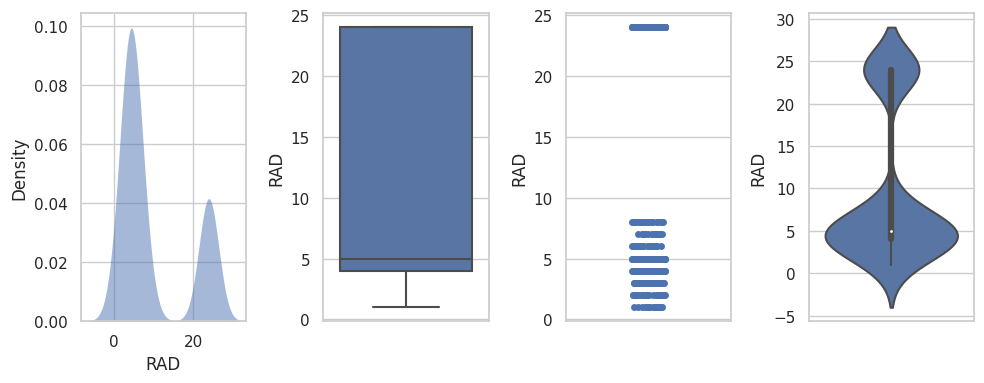

Ignoring `palette` because no `hue` variable has been assigned.


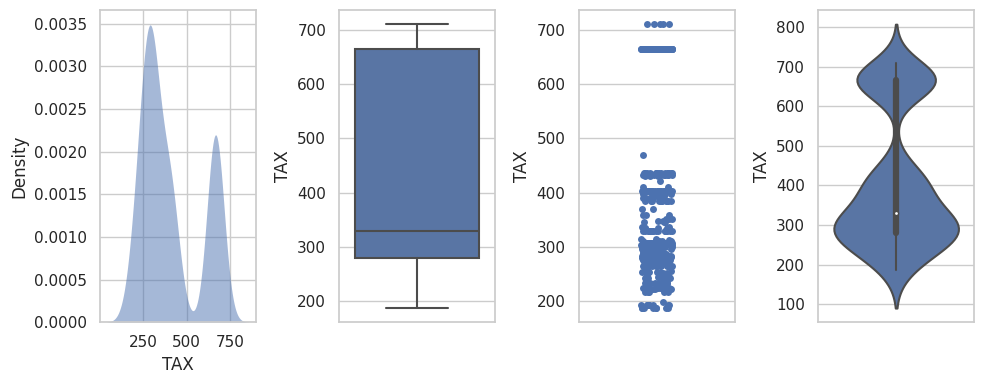

Ignoring `palette` because no `hue` variable has been assigned.


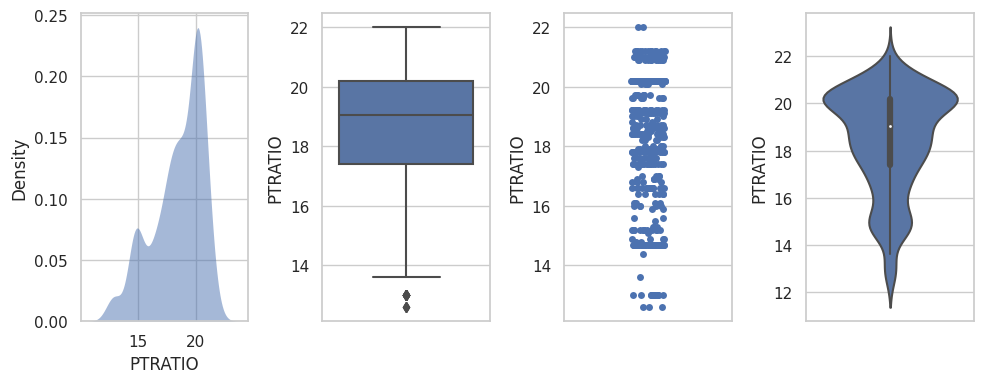

Ignoring `palette` because no `hue` variable has been assigned.


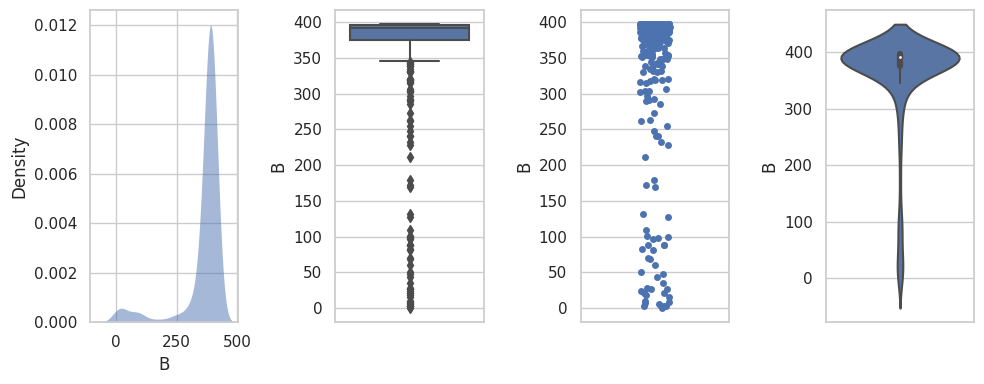

Ignoring `palette` because no `hue` variable has been assigned.


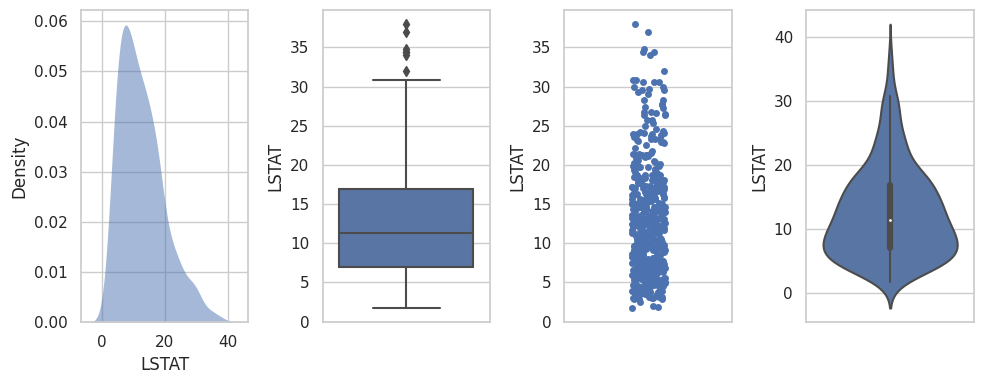

In [39]:
# EDA input data
var_num = X.columns
for i in var_num:
    fig, axs = plt.subplots(ncols=4, figsize=(10, 4))
    sns.kdeplot(
       data=data, x=i,
       fill=True, common_norm=False, palette="crest",
       alpha=.5, linewidth=0, ax=axs[0])
    sns.boxplot(data=data, y=i,ax=axs[1])
    sns.stripplot(y= i,data=data,ax=axs[2])
    sns.violinplot(data=data, y=i,ax=axs[3])
    fig.tight_layout()
    plt.show()

In [40]:
model = GradientBoostingRegressor()
model.fit(X, y)

GradientBoostingRegressor()

The explanation shows features each contributing to push the model output from the base value (the average model output over the training dataset we passed) to the model output. Features pushing the prediction higher are shown in red, those pushing the prediction lower are in blue.

In [41]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

# visualize the first prediction's explanation
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

If we take many explanations such as the one shown above, rotate them 90 degrees, and then stack them horizontally, we can see explanations for an entire dataset (in the notebook this plot is interactive):

In [42]:
# visualize the training set predictions
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


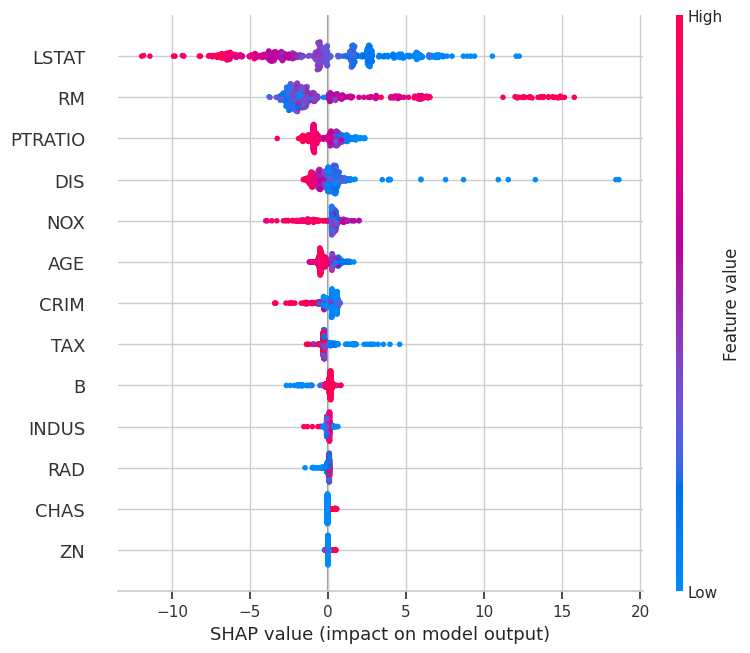

In [43]:
# summarize the effects of all the features
shap.summary_plot(shap_values, X)

# LIME Local Interpretable Model-Agnostic Explanations



The acronym LIME stands for Local Interpretable Model-agnostic Explanations. The project is about explaining what machine learning models are doing (source). LIME supports explanations for tabular models, text classifiers, and image classifiers (currently).

Models can be complex globally. Instead of focusing on the overall complex model behavior, Lime (Local Interpretable Model-Agnostic Explanations) focuses on a local region and uses a linear approximation to reflect the behavior around the instance being predicted.

https://marcotcr.github.io/lime/tutorials/Tutorial%20-%20continuous%20and%20categorical%20features.html

and

https://towardsdatascience.com/lime-how-to-interpret-machine-learning-models-with-python-94b0e7e4432e

## LIME installation

In [19]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [20]:
import lime
import lime.lime_tabular

## Simple example Iris

In [21]:
import sklearn
import sklearn.datasets
import sklearn.ensemble

iris = sklearn.datasets.load_iris()
train, test, labels_train, labels_test = sklearn.model_selection.train_test_split(iris.data, iris.target, train_size=0.80)
rf = sklearn.ensemble.RandomForestClassifier(n_estimators=500)
rf.fit(train, labels_train)

explainer = lime.lime_tabular.LimeTabularExplainer(train, feature_names=iris.feature_names, class_names=iris.target_names, discretize_continuous=True)

In [33]:
i = np.random.randint(0, test.shape[0])
print(i)
exp = explainer.explain_instance(test[i], rf.predict_proba, num_features=2, top_labels=1)

21


IndexError: ignored

In [23]:
exp.show_in_notebook(show_table=True, show_all=False)


## Carseats - More realistic example: classification

In [24]:
carseats = sm.datasets.get_rdataset("Carseats", "ISLR")
data = carseats.data

In [25]:
data['High Sales'] = np.where(data.Sales > 8, 1, 0)
# Una vez creada la nueva variable respuesta se descarta la original
data = data.drop(columns = 'Sales')

X = data[data.columns[:-1]]



target_name = 'High Sales'
y = data[target_name]

In [26]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

# One-hot-encoding de las variables categóricas
# ==============================================================================
# Se identifica el nobre de las columnas numéricas y categóricas
cat_cols = X.select_dtypes(include=['object', 'category']).columns.to_list()
numeric_cols = X.select_dtypes(include=['float64', 'int']).columns.to_list()

# Se aplica one-hot-encoding solo a las columnas categóricas
preprocessor = ColumnTransformer(
                    [('onehot', OneHotEncoder(handle_unknown='ignore'), cat_cols)],
                    remainder='passthrough'
               )

# Una vez que se ha definido el objeto ColumnTransformer, con el método fit()
# se aprenden las transformaciones con los datos de entrenamiento y se aplican a
# los dos conjuntos con transform(). Ambas operaciones a la vez con fit_transform().
X_prep = preprocessor.fit_transform(X)

# Convertir el output del ColumnTransformer en dataframe y añadir nombre columnas
# ==============================================================================
# Nombre de todas las columnas
encoded_cat = preprocessor.named_transformers_['onehot'].get_feature_names_out(cat_cols)
labels = np.concatenate([encoded_cat,numeric_cols])

# Conversión a dataframe
X_prep = pd.DataFrame(X_prep, columns=labels)
X_prep.info()

seed = 42
np.random.seed(seed)

# We have to transform categorical variables to use sklearn models
X_train, X_test, y_train, y_test = train_test_split(X_prep, y, test_size=0.20, random_state=seed)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ShelveLoc_Bad     400 non-null    float64
 1   ShelveLoc_Good    400 non-null    float64
 2   ShelveLoc_Medium  400 non-null    float64
 3   Urban_No          400 non-null    float64
 4   Urban_Yes         400 non-null    float64
 5   US_No             400 non-null    float64
 6   US_Yes            400 non-null    float64
 7   CompPrice         400 non-null    float64
 8   Income            400 non-null    float64
 9   Advertising       400 non-null    float64
 10  Population        400 non-null    float64
 11  Price             400 non-null    float64
 12  Age               400 non-null    float64
 13  Education         400 non-null    float64
dtypes: float64(14)
memory usage: 43.9 KB


In [27]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)
score = model.score(X_test, y_test)

In [28]:
import lime
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=[ " Low Sales"," High Sales"],
    mode='classification'
)

In [29]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[12],
    predict_fn=model.predict_proba
)

exp.show_in_notebook(show_table=True)

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


The model is 76% confident this is a High Sales store. The values of price and shelve location is not bad are the most important features that the algorithm decide the store is in "high sales" class.

In [34]:

exp = explainer.explain_instance(
    data_row=X_test.iloc[23],
    predict_fn=model.predict_proba
)

exp.show_in_notebook(show_table=True)

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


The model is 81% confident this is a bad wine. The values of alcohol, sulphates, and total sulfur dioxide increase wine’s chance to be classified as bad. The volatile acidity is the only one that decreases it.


# BORUTA feature selection and importance

https://towardsdatascience.com/boruta-explained-the-way-i-wish-someone-explained-it-to-me-4489d70e154a

In [30]:
!pip install boruta

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 5.1 MB/s eta 0:00:00


In [5]:
from boruta import BorutaPy

In [9]:
carseats = sm.datasets.get_rdataset("Carseats", "ISLR")
data = carseats.data

In [10]:
X = data[data.columns[1:]]
target_name = 'Sales'
y = data[target_name]

In [11]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

# One-hot-encoding de las variables categóricas
# ==============================================================================
# Se identifica el nobre de las columnas numéricas y categóricas
cat_cols = X.select_dtypes(include=['object', 'category']).columns.to_list()
numeric_cols = X.select_dtypes(include=['float64', 'int']).columns.to_list()

# Se aplica one-hot-encoding solo a las columnas categóricas
preprocessor = ColumnTransformer(
                    [('onehot', OneHotEncoder(handle_unknown='ignore'), cat_cols)],
                    remainder='passthrough'
               )

# Una vez que se ha definido el objeto ColumnTransformer, con el método fit()
# se aprenden las transformaciones con los datos de entrenamiento y se aplican a
# los dos conjuntos con transform(). Ambas operaciones a la vez con fit_transform().
X_prep = preprocessor.fit_transform(X)

# Convertir el output del ColumnTransformer en dataframe y añadir nombre columnas
# ==============================================================================
# Nombre de todas las columnas
encoded_cat = preprocessor.named_transformers_['onehot'].get_feature_names_out(cat_cols)
labels = np.concatenate([encoded_cat,numeric_cols])

# Conversión a dataframe
X_prep = pd.DataFrame(X_prep, columns=labels)
X_prep.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ShelveLoc_Bad     400 non-null    float64
 1   ShelveLoc_Good    400 non-null    float64
 2   ShelveLoc_Medium  400 non-null    float64
 3   Urban_No          400 non-null    float64
 4   Urban_Yes         400 non-null    float64
 5   US_No             400 non-null    float64
 6   US_Yes            400 non-null    float64
 7   CompPrice         400 non-null    float64
 8   Income            400 non-null    float64
 9   Advertising       400 non-null    float64
 10  Population        400 non-null    float64
 11  Price             400 non-null    float64
 12  Age               400 non-null    float64
 13  Education         400 non-null    float64
dtypes: float64(14)
memory usage: 43.9 KB


In [12]:
from boruta import BorutaPy

# definimos el random forest clasificador
randomForest = GradientBoostingRegressor()
randomForest.fit(X_prep, y)

# define Boruta feature selection
feature_selection = BorutaPy(randomForest, n_estimators = 'auto', verbose = 1,
                             random_state = 16, max_iter= 200)

In [13]:
# Get relevant features
feature_selection.fit(np.array(X_prep), np.array(y))

Iteration: 1 / 200
Iteration: 2 / 200
Iteration: 3 / 200
Iteration: 4 / 200
Iteration: 5 / 200
Iteration: 6 / 200
Iteration: 7 / 200
Iteration: 8 / 200
Iteration: 9 / 200
Iteration: 10 / 200
Iteration: 11 / 200
Iteration: 12 / 200
Iteration: 13 / 200
Iteration: 14 / 200
Iteration: 15 / 200
Iteration: 16 / 200
Iteration: 17 / 200
Iteration: 18 / 200
Iteration: 19 / 200
Iteration: 20 / 200
Iteration: 21 / 200
Iteration: 22 / 200
Iteration: 23 / 200
Iteration: 24 / 200
Iteration: 25 / 200
Iteration: 26 / 200
Iteration: 27 / 200
Iteration: 28 / 200
Iteration: 29 / 200
Iteration: 30 / 200
Iteration: 31 / 200
Iteration: 32 / 200
Iteration: 33 / 200
Iteration: 34 / 200
Iteration: 35 / 200
Iteration: 36 / 200
Iteration: 37 / 200
Iteration: 38 / 200
Iteration: 39 / 200
Iteration: 40 / 200
Iteration: 41 / 200
Iteration: 42 / 200
Iteration: 43 / 200
Iteration: 44 / 200
Iteration: 45 / 200
Iteration: 46 / 200
Iteration: 47 / 200
Iteration: 48 / 200
Iteration: 49 / 200
Iteration: 50 / 200
Iteration

BorutaPy(estimator=GradientBoostingRegressor(n_estimators=133,
                                             random_state=RandomState(MT19937) at 0x7F3A693D4540),
         max_iter=200, n_estimators='auto',
         random_state=RandomState(MT19937) at 0x7F3A693D4540, verbose=1)

In [14]:
# Creating list of varibale name, ranks, and final decision using zip
feature_rankings = list(zip(X_prep.columns,
                           feature_selection.ranking_,
                           feature_selection.support_))
pd.DataFrame(feature_rankings)

,0,1,2
0,ShelveLoc_Bad,1,True
1,ShelveLoc_Good,1,True
2,ShelveLoc_Medium,2,False
3,Urban_No,6,False
4,Urban_Yes,8,False
5,US_No,6,False
6,US_Yes,5,False
7,CompPrice,1,True
8,Income,1,True
9,Advertising,1,True


In Python cannot compute feature importance. In R is possible to do that but only we can use random forest.

Let's try to use Boruta package in R using Python.

In [1]:
# Instalar la versión correcta de rpy2
!pip install rpy2==3.5.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
# Caragamos librerías y extensions de Python
%load_ext rpy2.ipython

# Import rpy2 for dataframe conversion
import rpy2.robjects as ro
from rpy2.robjects.packages import importr
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter
from rpy2.robjects import globalenv

In [3]:
#Install and load libreries in R take 4 minutes ...

# Package names
%%R

packages <- c("Boruta")


# Install packages not yet installed
installed_packages <- packages %in% rownames(installed.packages())
if (any(installed_packages == FALSE)) {
   install.packages(packages[!installed_packages])
}

# Packages loading
invisible(lapply(packages, library, character.only = TRUE))

(as ‘lib’ is unspecified)
























	‘/tmp/Rtmpb2u5c2/downloaded_packages’



In [15]:
# Convertir pandas a data frame en R
# Convert the python dataframe to the R dataframe
with localconverter(ro.default_converter + pandas2ri.converter):
  dataR = ro.conversion.py2rpy(data)
# Check the type of the convertion output
type(dataR)
globalenv['dataR'] = dataR

/usr/local/lib/python3.10/dist-packages/rpy2/robjects/pandas2ri.py:54: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


In [16]:
# Mostrar data frame en R
%R head(dataR)

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No
5,10.81,124,113,13,501,72,Bad,78,16,No,Yes


In [17]:
# Determinar la importancia de los atributos.
%R boruta.model <- Boruta(Sales ~., data = dataR, doTrace = 2)

RecursionError: ignored

In [18]:
%R print(boruta.model)

Boruta performed 14 iterations in 7.711914 secs.
 7 attributes confirmed important: Advertising, Age, CompPrice, Income,
Price and 2 more;
 3 attributes confirmed unimportant: Education, Population, Urban;


RecursionError: ignored

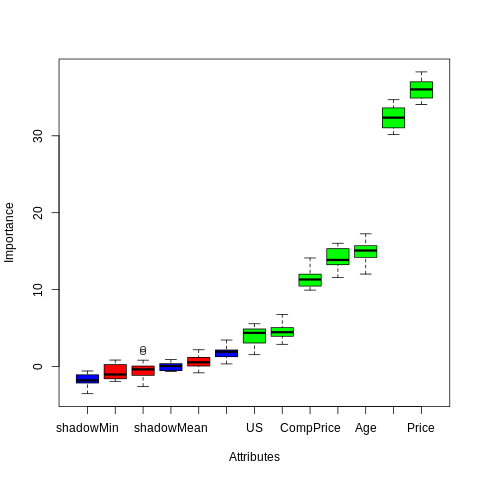

RecursionError: ignored

In [19]:
%R plot(boruta.model)

In [20]:
%R Importancia = as.data.frame(colMeans(boruta.model$ImpHistory))
%R colnames(Importancia) = "Importancia"
%R Importancia$Importancia = sort(Importancia$Importancia,decreasing=T)
%R Importancia

,Importancia
CompPrice,35.883360
Income,32.423409
Advertising,14.872461
Population,13.968347
Price,11.439089
ShelveLoc,4.466512
Age,4.010814
Education,1.863195
Urban,0.607175
US,0.034775


# Decision tree to explain blakbox models - Decisition tree Surrogate Model

In [21]:
import numpy as np
import pandas as pd
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pylab as plt
from sklearn import datasets, ensemble, model_selection
from sklearn.ensemble import GradientBoostingClassifier

## Carseats example

In [22]:
carseats = sm.datasets.get_rdataset("Carseats", "ISLR")
data = carseats.data

In [23]:
data['High Sales'] = np.where(data.Sales > 8, 1, 0)
# Una vez creada la nueva variable respuesta se descarta la original
data = data.drop(columns = 'Sales')

X = data[data.columns[:-1]]



target_name = 'High Sales'
y = data[target_name]

In [24]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

# One-hot-encoding de las variables categóricas
# ==============================================================================
# Se identifica el nobre de las columnas numéricas y categóricas
cat_cols = X.select_dtypes(include=['object', 'category']).columns.to_list()
numeric_cols = X.select_dtypes(include=['float64', 'int']).columns.to_list()

# Se aplica one-hot-encoding solo a las columnas categóricas
preprocessor = ColumnTransformer(
                    [('onehot', OneHotEncoder(handle_unknown='ignore'), cat_cols)],
                    remainder='passthrough'
               )

# Una vez que se ha definido el objeto ColumnTransformer, con el método fit()
# se aprenden las transformaciones con los datos de entrenamiento y se aplican a
# los dos conjuntos con transform(). Ambas operaciones a la vez con fit_transform().
X_prep = preprocessor.fit_transform(X)

# Convertir el output del ColumnTransformer en dataframe y añadir nombre columnas
# ==============================================================================
# Nombre de todas las columnas
encoded_cat = preprocessor.named_transformers_['onehot'].get_feature_names_out(cat_cols)
labels = np.concatenate([encoded_cat,numeric_cols])

# Conversión a dataframe
X_prep = pd.DataFrame(X_prep, columns=labels)
X_prep.info()

seed = 42
np.random.seed(seed)

# We have to transform categorical variables to use sklearn models
X_train, X_test, y_train, y_test = train_test_split(X_prep, y, test_size=0.20, random_state=seed)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ShelveLoc_Bad     400 non-null    float64
 1   ShelveLoc_Good    400 non-null    float64
 2   ShelveLoc_Medium  400 non-null    float64
 3   Urban_No          400 non-null    float64
 4   Urban_Yes         400 non-null    float64
 5   US_No             400 non-null    float64
 6   US_Yes            400 non-null    float64
 7   CompPrice         400 non-null    float64
 8   Income            400 non-null    float64
 9   Advertising       400 non-null    float64
 10  Population        400 non-null    float64
 11  Price             400 non-null    float64
 12  Age               400 non-null    float64
 13  Education         400 non-null    float64
dtypes: float64(14)
memory usage: 43.9 KB


In [25]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)
score = model.score(X_test, y_test)

In [26]:
predictions_model = model.predict(X_test)

In [27]:
model_tree2 = tree.DecisionTreeClassifier()
model_tree2.fit(X_test, predictions_model)

DecisionTreeClassifier()

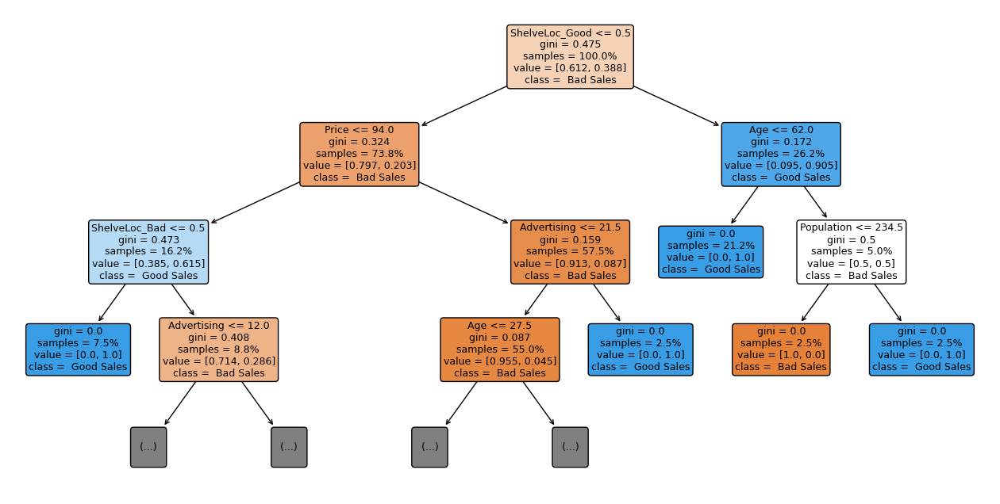

In [28]:
# visualization
fig = plt.figure(figsize=(16, 8))
vis2 = tree.plot_tree(model_tree2, feature_names = X_train.columns, class_names = [" Bad Sales", " Good Sales"], max_depth=3, fontsize=9, proportion=True, filled=True, rounded=True)

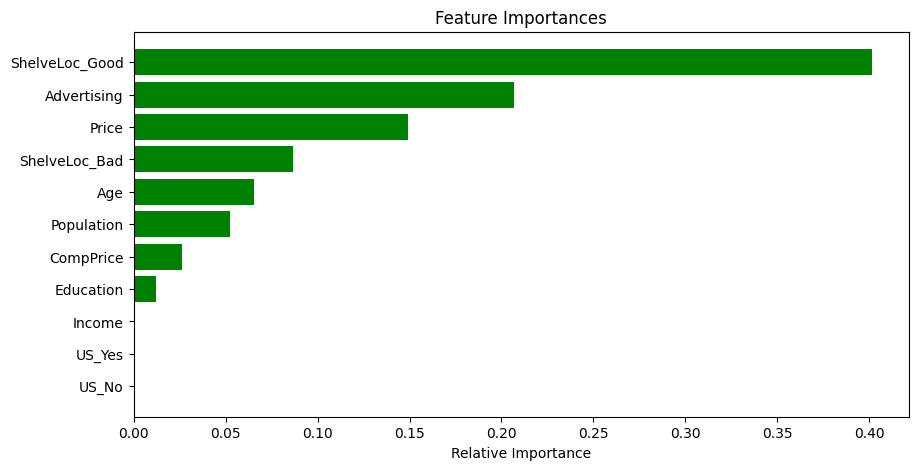

In [32]:
importances = model_tree2.feature_importances_
indices = np.argsort(importances)
features = X_test.columns
plt.title('Feature Importances')
j = 11# top j importance
plt.barh(range(j), importances[indices][len(indices)-j:], color='g', align='center')
plt.yticks(range(j), [features[i] for i in indices[len(indices)-j:]])
plt.xlabel('Relative Importance')
plt.show()

In [29]:
# model and fit
cls_t = tree.DecisionTreeClassifier()
cls_t.fit(X_train, y_train);

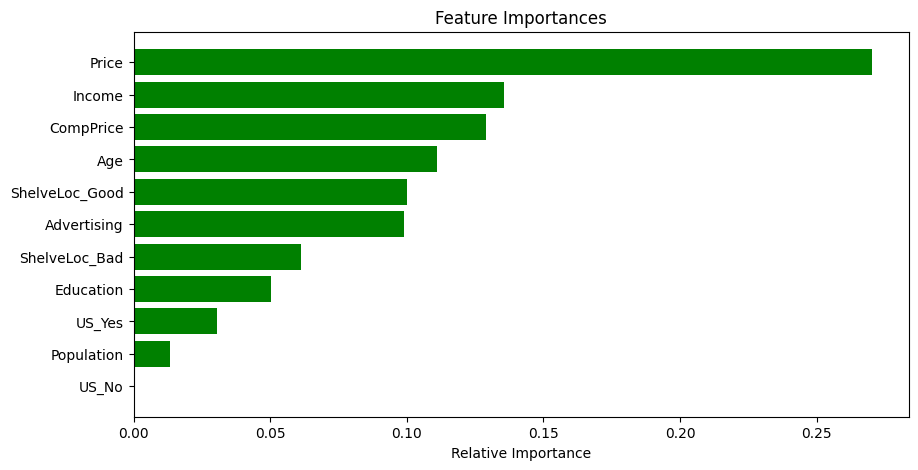

In [30]:
importances = cls_t.feature_importances_
indices = np.argsort(importances)
features = X_train.columns
plt.title('Feature Importances')
j = 11# top j importance
plt.barh(range(j), importances[indices][len(indices)-j:], color='g', align='center')
plt.yticks(range(j), [features[i] for i in indices[len(indices)-j:]])
plt.xlabel('Relative Importance')
plt.show()

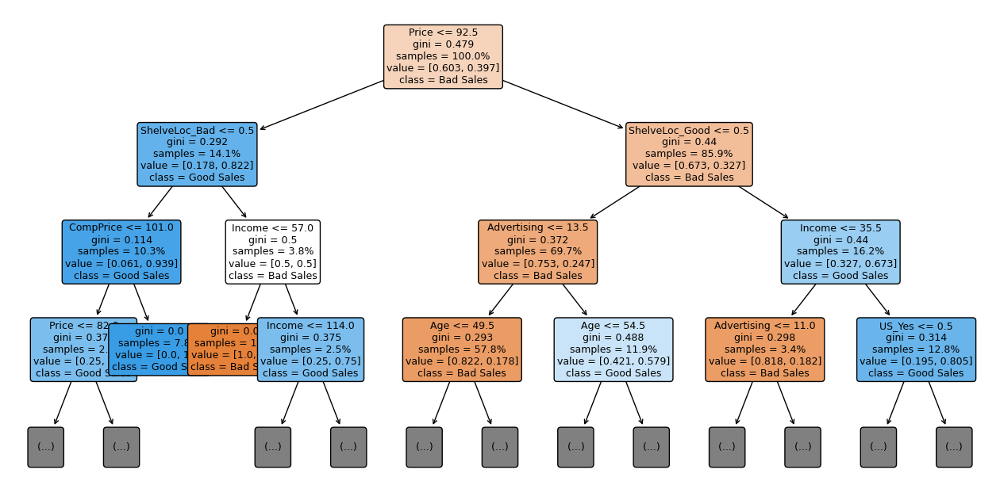

In [31]:
# visualization
fig = plt.figure(figsize=(16, 8))
vis = tree.plot_tree(cls_t, feature_names =X_train.columns, class_names = ["Bad Sales", "Good Sales"], max_depth=3, fontsize=9, proportion=True, filled=True, rounded=True)

## More than 50k income example

In [3]:
df = pd.read_csv(
    "https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data",
    header=None)
df.columns = [
    "Age", "WorkClass", "fnlwgt", "Education", "EducationNum",
    "MaritalStatus", "Occupation", "Relationship", "Race", "Gender",
    "CapitalGain", "CapitalLoss", "HoursPerWeek", "NativeCountry", "Income"
]
X = df.iloc[:, :-1]
y = (df.iloc[:, -1] == " >50K").astype(int)

seed = 42
np.random.seed(seed)

# We have to transform categorical variables to use sklearn models
X = pd.get_dummies(X, prefix_sep='.').astype(float)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=seed)

from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)
score = model.score(X_test, y_test)

In [15]:
predictions_model = model.predict(X_test)

In [16]:
model_tree2 = tree.DecisionTreeClassifier()
model_tree2.fit(X_test, predictions_model)

DecisionTreeClassifier()

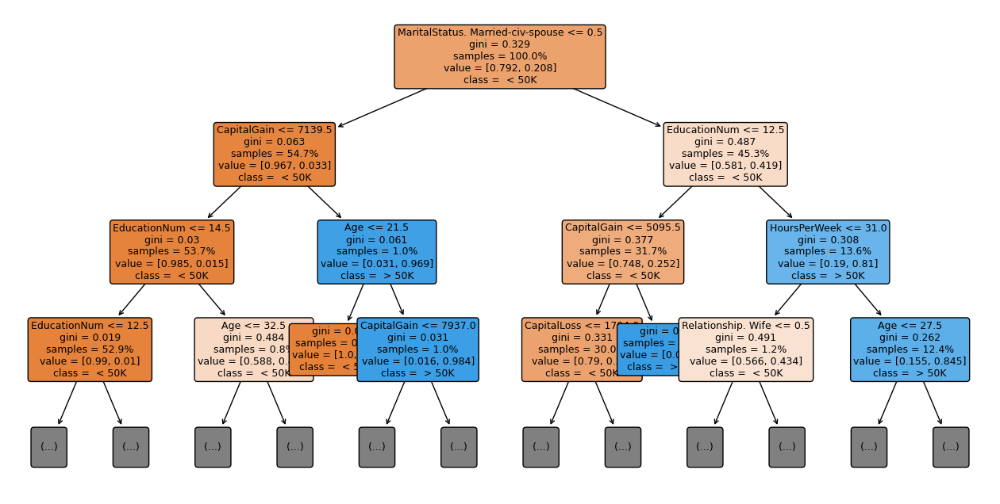

In [17]:
# visualization
fig = plt.figure(figsize=(16, 8))
vis2 = tree.plot_tree(model_tree2, feature_names = X_train.columns, class_names = [" < 50K", " > 50K"], max_depth=3, fontsize=9, proportion=True, filled=True, rounded=True)

In [11]:
# model and fit
cls_t = tree.DecisionTreeClassifier()
cls_t.fit(X_train, y_train);

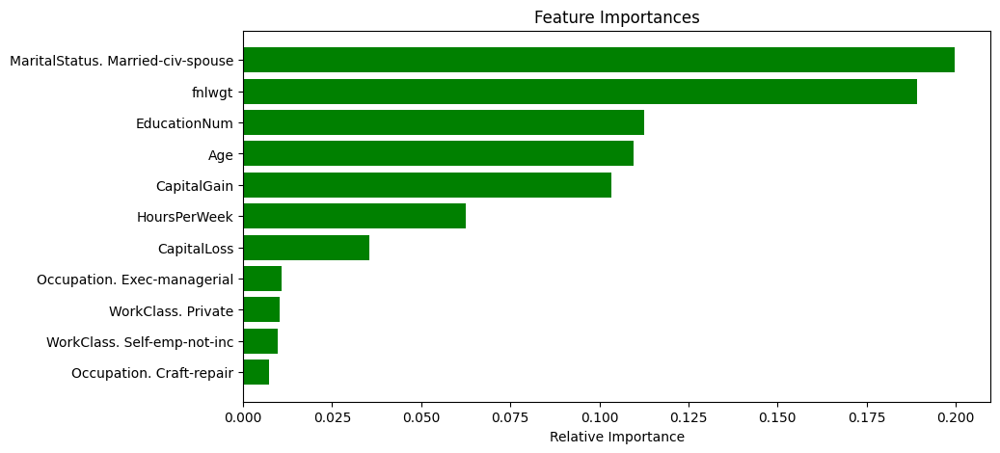

In [13]:
importances = cls_t.feature_importances_
indices = np.argsort(importances)
features = X_train.columns
plt.title('Feature Importances')
j = 11# top j importance
plt.barh(range(j), importances[indices][len(indices)-j:], color='g', align='center')
plt.yticks(range(j), [features[i] for i in indices[len(indices)-j:]])
plt.xlabel('Relative Importance')
plt.show()

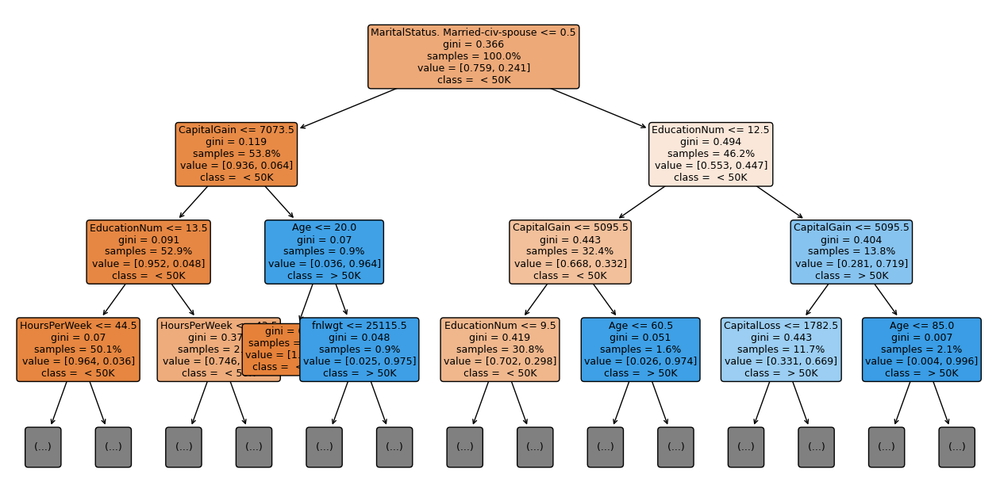

In [14]:
# visualization
fig = plt.figure(figsize=(16, 8))
vis = tree.plot_tree(cls_t, feature_names =X_train.columns, class_names = [" < 50K", " > 50K"], max_depth=3, fontsize=9, proportion=True, filled=True, rounded=True)

# Interpret ML library

https://interpret.ml/docs/getting-started.html

## Intall ML library

In [141]:
!pip install interpret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Explain the Glassbox

In [135]:
df = pd.read_csv(
    "https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data",
    header=None)
df.columns = [
    "Age", "WorkClass", "fnlwgt", "Education", "EducationNum",
    "MaritalStatus", "Occupation", "Relationship", "Race", "Gender",
    "CapitalGain", "CapitalLoss", "HoursPerWeek", "NativeCountry", "Income"
]
X = df.iloc[:, :-1]
y = (df.iloc[:, -1] == " >50K").astype(int)

seed = 42
np.random.seed(seed)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=seed)

In [136]:
X.head()

,Age,WorkClass,fnlwgt,Education,EducationNum,MaritalStatus,Occupation,Relationship,Race,Gender,CapitalGain,CapitalLoss,HoursPerWeek,NativeCountry
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba


In [137]:
from interpret.glassbox import ExplainableBoostingClassifier
ebm = ExplainableBoostingClassifier()
ebm.fit(X_train, y_train)

ExplainableBoostingClassifier()

In [138]:
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())

In [139]:
from interpret import show
show(ebm.explain_global())

## Local explanations

In [140]:
from interpret import show
show(ebm.explain_local(X_test[:5], y_test[:5]),0)

## Build a Blackbox Pipeline

In [119]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

# We have to transform categorical variables to use sklearn models
X = pd.get_dummies(X, prefix_sep='.').astype(float)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=seed)

#Blackbox system can include preprocessing, not just a classifier!
pca = PCA()
rf = RandomForestClassifier(random_state=seed)

blackbox_model = Pipeline([('pca', pca), ('rf', rf)])
blackbox_model.fit(X_train, y_train)

Pipeline(steps=[('pca', PCA()),
                ('rf', RandomForestClassifier(random_state=42))])

## Explain the Blackbox

In [120]:
from interpret.blackbox import LimeTabular
from interpret import show

lime = LimeTabular(blackbox_model, X_train, random_state=seed)
show(lime.explain_local(X_test[:5], y_test[:5]),0)